
## Predicting Residence Time of Lake Basins in the USA and China

### James (Jake) Gearon
#### Department of Geological Sciences, Jackson School of Geosciences
##### [Twitter](https://twitter.com/JakeGearon) | [LinkedIn](https://www.linkedin.com/in/jake-gearon-742767148/) | [Website](https://jameshgrn.github.io)

### Subsurface Machine Learning Course, The University of Texas at Austin
#### Hildebrand Department of Petroleum and Geosystems Engineering, Cockrell School of Engineering
#### Department of Geological Sciences, Jackson School of Geosciences




_____________________

Workflow supervision and review by:

#### Instructor: Prof. Michael Pyrcz, Ph.D., P.Eng., Associate Professor, The Univeristy of Texas at Austin
##### [Twitter](https://twitter.com/geostatsguy) | [GitHub](https://github.com/GeostatsGuy) | [Website](http://michaelpyrcz.com) | [GoogleScholar](https://scholar.google.com/citations?user=QVZ20eQAAAAJ&hl=en&oi=ao) | [Book](https://www.amazon.com/Geostatistical-Reservoir-Modeling-Michael-Pyrcz/dp/0199731446) | [YouTube](https://www.youtube.com/channel/UCLqEr-xV-ceHdXXXrTId5ig)  | [LinkedIn](https://www.linkedin.com/in/michael-pyrcz-61a648a1)

#### Course TA: Jack Xiao, Graduate Student, The University of Texas at Austin
##### [Twitter](https://twitter.com/jackxiao6) | [LinkedIn](https://www.linkedin.com/in/yuchen-jack-xiao-b1b20876/)


### Executive Summary

_There are an estimated 320 million lakes in the world, accounting for ~21% of earth's surface freshwater. Understanding the hydrodynamics of these reservoirs is crucial for water budget analysis/monitoring. I use a novel combination of datasets to develop a predictive model of residence time for lakes in the USA and China. I performed data preparation including outlier removal, feature selection, and feature transformation. The Random Forest Regressor was tuned using a Random Search and then a Grid Search. The model was scored using a range of metrics, but generated MAE values of 0.1403 and 0.6438 for USA and China, respectively. The most salient features for predicting residence time were watershed area mean monthly precipitation. I recommend exploring options to further reduce model variance before proceeding with this model._

In [2]:
import pandas as pd # DataFrames and plotting
import numpy as np # arrays and matrix math
import matplotlib.pyplot as plt # plotting
import seaborn as sns;sns.set_style("whitegrid") # plotting
from scipy import stats # for z-score removal of outliers
from sklearn.preprocessing import StandardScaler # Data Transformation
from sklearn.ensemble import RandomForestRegressor # Model Instantiator
from sklearn.model_selection import train_test_split # Data Preparation
from sklearn.feature_selection import RFE # Feature selection
import pprint # Nice printing
from sklearn.model_selection import RandomizedSearchCV # Hyper Parameter Tuning
from sklearn import metrics # regressor metrics
import geopandas as gpd # to read in HydroLAKES data
from sklearn.model_selection import GridSearchCV # Hyper Parameter Tuning
from sklearn.metrics import explained_variance_score # R2 score metrics
import warnings; warnings.simplefilter('ignore') # suppress warnings
from joblib import dump, load # model persistence
%matplotlib inline

In [182]:
# Helper Function: This prints out regression metrics.
def regression_results(y_true, y_pred):

    # Regression metrics
    explained_variance=metrics.explained_variance_score(y_true, y_pred)
    mean_absolute_error=metrics.mean_absolute_error(y_true, y_pred) 
    mse=metrics.mean_squared_error(y_true, y_pred) 
    median_absolute_error=metrics.median_absolute_error(y_true, y_pred)


    print('explained_variance: ', round(explained_variance,4))    
    print('MAE: ', round(mean_absolute_error,4))
    print('MSE: ', round(mse,4))
    print('RMSE: ', round(np.sqrt(mse),4))

# Project Goal

## Objective
I will develop a model to predict **residence time** in Lake Basins for the USA. **Residence time** is calculated as the ratio between total lake volume (‘Vol_total’) and average long-term discharge (‘Dis_avg’). The model will be validated on China.

## Workflow Steps
1. Data Preparation
2. Feature Selection
3. Hyperparameter Tuning
4. Model Metrics
5. Summary

# Data Background

This, like many ML projects, was mostly data preparation. The data here comes from 3 distinct but related sources: 
 all global datasets developed for investigating surface water dynamics via remote sensing.
 
1. Global Lake Area, Climate, and Population Dataset
    - _The GLCP is a compilation of lake surface area for 1.42 + million lakes and reservoirs of at least 10 ha in size from 1995 to 2015 with co-located basin-level temperature, precipitation, and population data._
2. HydroLAKES Dataset
    - _HydroLAKES is a database aiming to provide the shoreline polygons of all global lakes with a surface area of at least 10 ha. Additional attributes for each of the 1.4 million lakes include estimates of the shoreline length, average depth, water volume and residence time. All lakes are co-registered to the global river network of the HydroSHEDS database via their lake pour points._
3. HydroBASINS Dataset
    - _HydroBASINS is a series of polygon layers that depict watershed boundaries and sub-basin delineations at a global scale. The goal of this product is to provide a seamless global coverage of consistently sized and hierarchically nested sub-basins at different scales (from tens to millions of square kilometers), supported by a coding scheme that allows for analysis of watershed topology such as up- and downstream connectivity._


They all use the ID's from the oldest dataset: HydroBASINS, making merging easy.



## GLCP Data Preparation

[Link to Dataset](https://www.nature.com/articles/s41597-020-0517-4)

Here are the columns for the GLCP:
- year
- Hylak_id _(HydroLAKES ID)_
- centr_lat
- centr_lon
- continent
- country
- bsn_lvl _(Pfafstatter Basin Level)_
- HYBAS_ID _(HydroBASINS ID)_
- mean_monthly_precip_mm
- total_precip_mm
- mean_annual_temp_k _(in Kelvin)_
- pop_sum _(Population of the Drainage Basin at 5 yr intervals)_
- seasonal_km2 _(Seasonal Water Area-Pixels that are not covered year-round by water)_
- permanent_km2 _(Pixels that are fully covered by water in a year)_
- total_km2 _(Seasonal + Permanent Water per annum)_

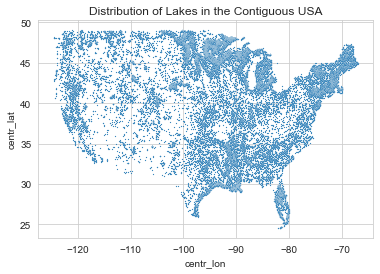

In [3]:
df_glcp = pd.read_csv("/Users/jakegearon/PycharmProjects/Geostats/glcp.csv") #Load Data in and restrict to the latitude and longitude of the continguous USA
df_glcp = df_glcp[df_glcp['country'] == "United States of America"]
df_glcp = df_glcp[df_glcp['centr_lat']< 50]
df_glcp = df_glcp[df_glcp['centr_lat'] > 20]
df_glcp = df_glcp[df_glcp['centr_lon'] < -50]
grp = df_glcp.groupby(["Hylak_id"])
gr_df = grp.mean()
df_glcp = gr_df.drop(["year"], axis=1)
sns.scatterplot(data=df_glcp, x='centr_lon', y='centr_lat', s=1.5)
plt.title('Distribution of Lakes in the Contiguous USA')
plt.show()

## HydroLAKES Data Preparation
[Link to Dataset](https://www.hydrosheds.org/page/hydrolakes)

Here are the columns for HydroLAKES:
- Hylak_id _(HydroLAKES ID)_
- Lake_name
- Country
- Continent
- Poly_src _(Original source for lake polygons)_
- Lake_type _(Lake Type indicator— Lake, Reservoir, Unknown)_
- Lake_area _(Lake Surface Area)_
- Shore_len _(Length of shoreline (i.e. polygon outline), in kilometers.)_
- Shore_dev _(Shoreline development, measured as the ratio between shoreline length and the circumference of a circle with the same area.)_
- Vol_total _(Total lake or reservoir volume, in million cubic meters (1 mcm = 0.001 km3).)_
- Vol_res _(Reported reservoir volume,  or storage volume of added lake regulation, in million cubic meters (1 mcm = 0.001 km3).)_
- Depth_avg _(Average lake depth, in meters.)_
- Dis_avg _(Average long-term discharge flowing through the lake, in cubic meters per second.)_
- Res_time _(Average residence time of the lake water, in days.)_
- Elevation _(Elevation of lake surface, in meters above sea level.)_
- Slope_100 _(Average slope within a 100 meter buffer around the lake polygon, in degrees.)_
- Wshd_area _(Area of the watershed associated with the lake, in square kilometers.)_

In [4]:
hyl = gpd.read_file("/Users/jakegearon/PycharmProjects/Geostats/HydroLAKES_polys_v10_shp/HydroLAKES_polys_v10_shp/HydroLAKES_polys_v10.dbf")
hyl['Hylak_id']= hyl['Hylak_id'].astype(int)
mg = pd.merge(left=df_glcp, right=hyl, on='Hylak_id', how='inner')
mg.head()

,Hylak_id,centr_lat,centr_lon,HYBAS_ID,mean_monthly_precip_mm,total_precip_mm,mean_annual_temp_k,pop_sum,seasonal_km2,permanent_km2,...,Vol_src,Depth_avg,Dis_avg,Res_time,Elevation,Slope_100,Wshd_area,Pour_long,Pour_lat,geometry
0,5,47.526524,-87.756530,7040392520,65.084254,8.038845e+06,276.678486,7.079868e+05,52.567197,82082.929797,...,1,146.7,2869.953,48410.3,179,-1.0,209219.5,-84.460547,46.468593,"POLYGON ((-90.72250 46.65740, -90.72458 46.657..."
1,6,44.007419,-86.757354,7040392650,71.047201,7.060073e+06,280.622594,1.110945e+07,26.139216,57798.417286,...,1,84.2,1877.753,29956.0,175,-1.0,176006.4,-84.753910,45.822916,"POLYGON ((-84.75366 45.83889, -84.75365 45.783..."
2,7,43.655405,-77.762059,7040402430,71.389109,9.988129e+06,281.429045,2.440389e+07,39.413857,19338.382677,...,1,84.8,7745.819,2450.5,73,-1.0,766137.4,-75.794246,44.480557,"POLYGON ((-79.09167 43.81213, -79.09133 43.812..."
3,8,44.948473,-82.261189,7030034520,71.199578,4.143956e+07,278.737092,4.552233e+07,110.418513,59247.929204,...,1,59.8,9162.152,4484.5,175,-1.0,576017.7,-82.422576,42.999403,"POLYGON ((-80.99694 45.92284, -80.99838 45.921..."
4,9,42.148407,-81.245095,7040402430,71.389109,9.988129e+06,281.429045,2.440389e+07,54.091616,25725.338927,...,1,19.4,9796.883,589.5,172,-1.0,679903.4,-78.908084,42.904334,"POLYGON ((-83.34778 41.88395, -83.34840 41.883..."


# Feature Selection

I first needed to drop all the columns that deal with location, ID, source, population, etc. These are variables that will likely not be informative. I also dropped the numerical features that are used in the calculation of residence time (Vol_res and Dis_avg)

I then computed a pairplot for the variables I kept:
- mean_monthly_precip_mm
- permanent_km2
- total_km2
- Shore_len
- Depth_avg
- Wshd_area
- total_precip_mm
- mean_annual_temp_k'
- Shore_dev
- Depth_avg
- Res_time
- Elevation
- Slope_100

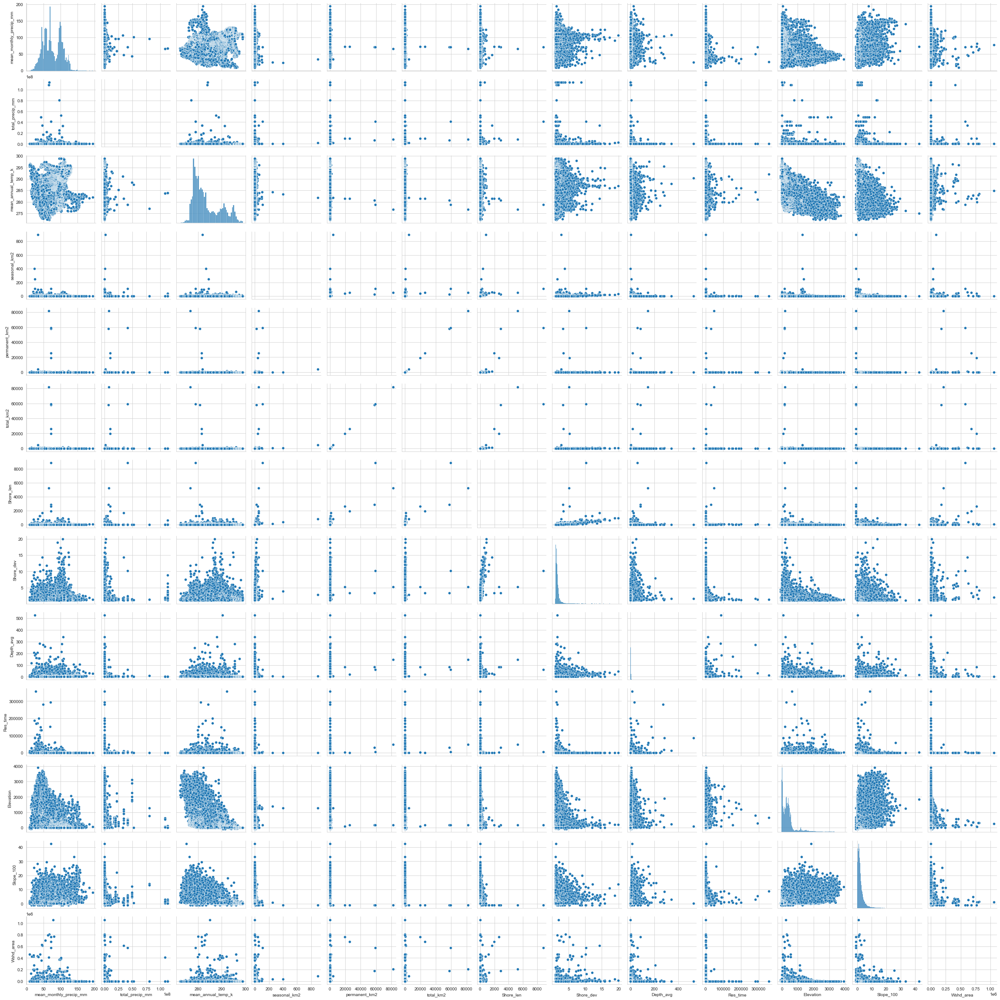

In [32]:
drop_list = ['Hylak_id', 'centr_lat', 'centr_lon', 'HYBAS_ID', 'Lake_name', 'Country', 'Continent',
                    'Poly_src', 'Lake_type', 'Grand_id', 'Lake_area', 'Vol_src', 'pop_sum',
                    'geometry', 'Pour_lat', 'Pour_long', 'Dis_avg', 'Vol_total', 'Vol_res']
ldf = mg.drop(drop_list, axis=1)
sns.pairplot(ldf)
plt.show()

The above pairplot shows a need for data transformation. There are a multitude of scales and outliers within these features that make data visualization difficult. Due to the large amount of data it is infeasible to manually clean outliers. I need to deal with outliers, and easily. Here I decided to take a "greedy" approach (meaning I may be throwing out valid datapoints in the name of ease of use) and **filter out any datapoints that have a Z-score higher than 3.** This means that any point that is > 3 standard deviations above the mean is dropped. Additionally, I removed  rows with erroneous values in the "Res_time" and "Slope_100" columns as they cause errors in the subsequent data transformation.

Let's see what the new data look like in a pairplot

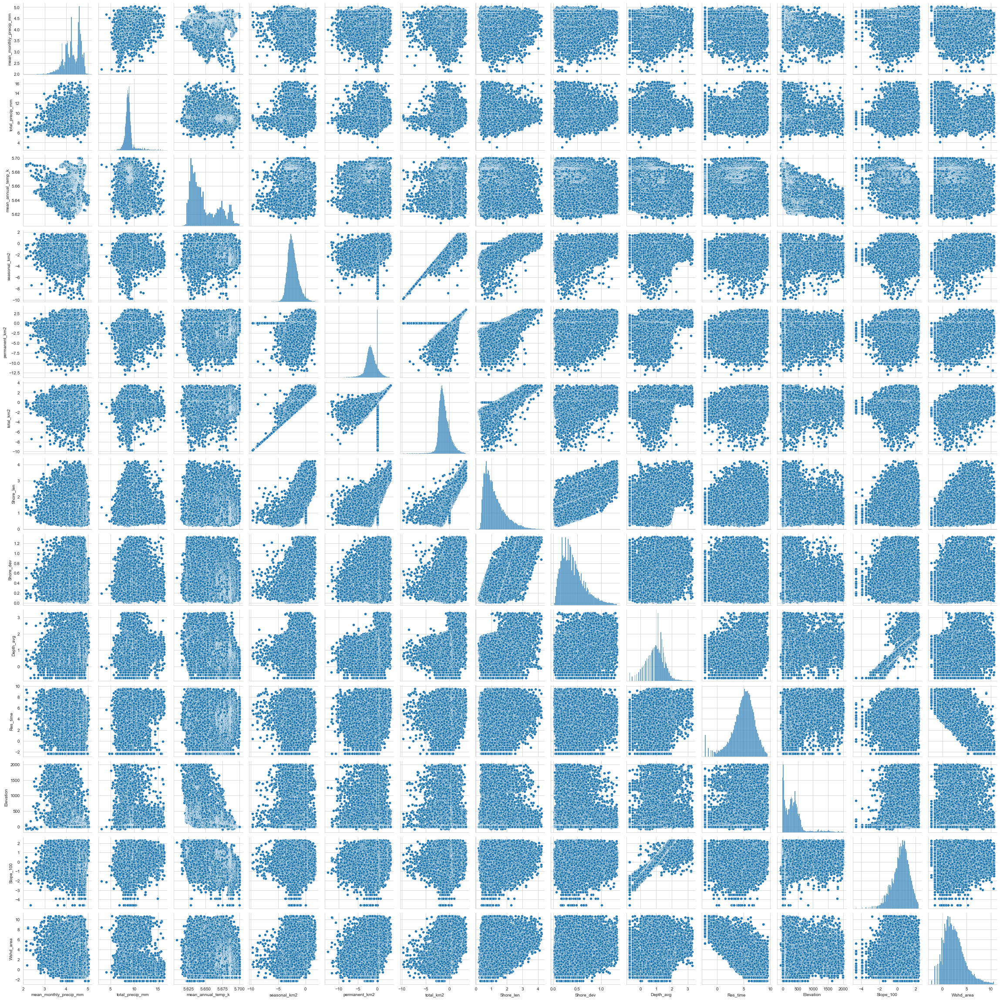

In [194]:
ldf = ldf[(ldf['Res_time'] != -1)]
ldf = ldf[(ldf['Res_time'] != -9999)]
ldf = ldf[(ldf['Slope_100'] != -1)]
ldf = ldf[(ldf['Slope_100'] != -9999)]
ldf = ldf[(np.abs(stats.zscore(ldf)) < 3).all(axis=1)] # drop any datapoints greater than 3 std. dev above or below mean.
ldf = ldf.apply(lambda x: np.log(x) if x.name in ldf.drop(['Elevation'], axis=1).columns else 0 if x.item == 0 else x) # Log
dd = ldf.replace(-np.inf, 0)
sns.pairplot(dd)
plt.show()

This looks a lot better, we may have removed more datapoints than neccessary, but for now we will continue with these features. Next we need to choose which of these features is best suited to the task of predicting **residence time**

## Recursive Feature Elimination

I need to determine the salient features. To do this, I create a Recursive Feature Eliminator with a base random forest regressor model and a step size of 1 (meaning we will recursively eliiminate one features based on its ranking metric)

> RFE works by taking an external estimator that assigns weights to features (e.g., the coefficients of a linear model), the goal of recursive feature elimination (RFE) is to select features by recursively considering smaller and smaller sets of features. sci-kit learn documentation 0.23.2.

_[code modified from Will Koehrsen](https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74)_

After instantiating the base random forest model, dropping any existing NaNs, and breaking the data into training (75% of data) and testing (25% of data) datasets we can fit the RFE

In [7]:
rf = RandomForestRegressor()
dd.dropna(inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dd.drop(['Res_time'], axis=1), dd.Res_time, test_size=.25, train_size=.75)

Now we can fit the RFE and investigate the variables and their associated ranks to determine which features to use in our Random Forest Regressor.

In [8]:
rfe = RFE(estimator=rf, step=1) # instantiate Recursive Feature Eliminator
rfe.fit(X_train, y_train) # fit our training data with the RFE algorithm
# We then create a dataframe of our features with associated rankings
vardf = pd.DataFrame(zip(X_train.columns,
                rfe.ranking_), columns=['Variable', 'Ranking'])
print("DataFrame of Features with associated Rank")
pprint.pprint(vardf)
# We then eliminate any features with a rank less than 1, these will be our "good features"
vardf = vardf[vardf['Ranking'] == 1]
print("\n")
print("DataFrame of Features with Rank of 1")
pprint.pprint(vardf)
good_features = list(vardf.Variable.values)
print("\n")
print("Good Features: ", good_features)
#Compute new training and testing data only using the good features from RFE
X_train, X_test, y_train, y_test = train_test_split(dd.filter(good_features),
                                                    dd.Res_time, test_size=.25, random_state=42)

DataFrame of Features with associated Rank
                  Variable  Ranking
0   mean_monthly_precip_mm        1
1          total_precip_mm        7
2       mean_annual_temp_k        4
3             seasonal_km2        6
4            permanent_km2        1
5                total_km2        1
6                Shore_len        2
7                Shore_dev        5
8                Depth_avg        1
9                Elevation        1
10               Slope_100        3
11               Wshd_area        1


DataFrame of Features with Rank of 1
                  Variable  Ranking
0   mean_monthly_precip_mm        1
4            permanent_km2        1
5                total_km2        1
8                Depth_avg        1
9                Elevation        1
11               Wshd_area        1


Good Features:  ['mean_monthly_precip_mm', 'permanent_km2', 'total_km2', 'Depth_avg', 'Elevation', 'Wshd_area']


Out of 12 candidate features, 5 were assigned a rank of 1. It is important at this point to step back and assess the variables returned from the model with my subject matter knowledge. It is plausible to me that precipitation, water surface area, depth, elevation, and watershed area give information about **residence time**. This "sanity check" is helpful to ensure we are not missing some structural error in the model or data.

We can now move on to _hyperparameter tuning_

# Hyperparameter tuning & optimization

## Randomized Search with Cross-Validation

To determine the optimal parameters for our Random Forest Regressor, we will utilize two tuning algorithms, a Randomized Search and a Grid Search. I decided to use both in order to ensure the best parameters for the dataset. Random Search will sample parameter distributions. I can then use the output of the Random Search to develop a higher resolution range of parameters for the exhaustive grid search, which computes across every combination of parameters.

I will start with the [Randomized Search](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html#sklearn.model_selection.RandomizedSearchCV):
> RandomizedSearchCV implements a randomized search over parameters, where each setting is sampled from a distribution over possible parameter values. _sci-kit learn documentation 0.23.2._

We have to give our randomized search somewhere to start, so we can create a pythonic dictionary of parameter possibilities that the algorithm will pick from to compute the lowest mean absolute error over 300 individual fit combinations.

_[code modified from Will Koehrsen](https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74)_

In [195]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(40, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print("\n")
pprint.pprint(random_grid)



{'bootstrap': [True, False],
 'max_depth': [40, 47, 54, 61, 68, 75, 82, 89, 96, 103, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


We must first instantiate another base Random Forest Regressor in order to perform the Randomized Search.
We tell the algorithm to perform 100 iterations of the model with different combinations of parameters, this will be done 3 separate times with different subsets of our training data to combat overfitting and selection bias.

In [43]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation,
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=3, random_state=42, n_jobs = -1, scoring='neg_mean_absolute_error')# Fit the random search model
rf_random.fit(X_train, y_train)
pprint.pprint(rf_random.best_params_)
# Plot number of features VS. cross-validation scores
# Create a based model


Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed: 64.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 70.1min finished


{'n_estimators': 1600, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 82, 'bootstrap': False}


##### Success!
We have honed in on the best values from our randomized search (see above). We can now use these values to inform our grid search parameters using ranges around the best values.

| Parameter | Random Search Best Parameters |
|---|---|
| bootstrap | False |
| max_depth | 82|
| max_features | sqrt |
| min_samples_leaf | 1 |
| min_samples_split | 5 |
| n_estimators | 1600 |

## Grid Search with Cross-Validation

The grid search is the most popular hyperparameter tuning algorithm. It fits every possible combination of parameters, scores them, then retains the set of parameters that lead to the lowest mean absolute error. 

| Parameter | Grid Search Possible Values |
|---|---|
| bootstrap | False |
| max_depth | 78, 80, 82, 84 |
| max_features | 2, 4, 6 |
| min_samples_leaf | 1, 2 |
| min_samples_split | 4, 5, 6 |
| n_estimators | 1400, 1600, 1800 |

Once we create our parameter grid, we _again_ instantiate a base model and feed the parameter grid into the [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html#sklearn.model_selection.GridSearchCV) model:
> The grid search provided by GridSearchCV exhaustively generates candidates from a grid of parameter values specified with the param_grid parameter. For instance, the following param_grid:. _sci-kit learn documentation 0.23.2._

This will take quite a bit of time to compute—**6 hours!**—even with 64 GB of RAM and a 2.3 GHz 8-Core Intel Core i9...

In order to maintain model persistence, we will use [joblib](https://joblib.readthedocs.io/en/latest/) to save our tuned model to disk

_[code modified from Will Koehrsen's Article in TowardsDataScience](https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74)_

In [45]:
param_grid = {
    'bootstrap': [False],
    'max_depth': [78, 80, 82, 84],
    'max_features': [2, 4, 6],
    'min_samples_leaf': [1, 2],
    'min_samples_split': [4, 5, 6],
    'n_estimators': [1400, 1600, 1800,]
}

rf_grid = RandomForestRegressor()# Instantiate the grid search base model
grid_search = GridSearchCV(estimator = rf_grid, param_grid = param_grid, 
                        cv = 3, n_jobs = -1, verbose = 3, scoring='neg_mean_absolute_error',
                        refit=True)
# Fit the grid search to the data
grid_search.fit(X_train, y_train)
best_grid = grid_search.best_estimator_
y_pred = best_grid.predict(X_test)
dump(best_grid, '/Users/jakegearon/PycharmProjects/Geostats/RandForestGS_SSML.joblib')

Fitting 3 folds for each of 216 candidates, totalling 648 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed: 33.1min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed: 105.7min
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed: 227.9min
[Parallel(n_jobs=-1)]: Done 648 out of 648 | elapsed: 332.8min finished


['/Users/jakegearon/PycharmProjects/Geostats/RandForestGS_SSML.joblib']

In [14]:
X.shape

(40854, 12)

In [19]:
type(y)

pandas.core.series.Series

In [18]:
X = dd.drop(['Res_time'], axis=1)
y = dd.Res_time
rf_tuned = load('/Users/jakegearon/PycharmProjects/Geostats/RandForestGS_SSML.joblib')
rf_tuned.fit(X, y)


RandomForestRegressor(bootstrap=False, max_depth=82, max_features=2,
                      min_samples_split=4, n_estimators=1600)

# Model Metrics

Now we use our tuned model to predict residence times from our testing data. We can use our defined helper function to compute the results from our model 

In [20]:
y_pred = rf_tuned.predict(X_test)
regression_results(y_test, y_pred)

ValueError: Number of features of the model must match the input. Model n_features is 12 and input n_features is 6 

The explained variance is high and the error metrics are all < .4, likely indicating a degree of overfit (model variance). The results from the eventual China dataset validation will give insight into this possibility.

## Feature Importances
Let's see the feature importances designated by our tuned model. This uses the Gini coefficient to determine the influence of featues on the response prediction.

In [117]:
# Get numerical feature importances
importances = list(best_grid.feature_importances_)# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(good_features, importances)]# Sort the
# feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)# Print out the feature and importances
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: Wshd_area            Importance: 0.57
Variable: mean_monthly_precip_mm Importance: 0.18
Variable: permanent_km2        Importance: 0.07
Variable: total_km2            Importance: 0.07
Variable: Depth_avg            Importance: 0.06
Variable: Shore_len            Importance: 0.05


Watershed area and mean monthly precipitation make up 75% of total feature importance... this is of interest as it means residence time may depend on only 2 main features, making prediction simpler at scale.

## Histogram of Error

We can see that our mean error is good: ~0.1, the std. dev. is decent at 0.3 and our RMSE is good at 0.3

Mean Error: 0.013279063046508397
Std. Dev. Error: 0.31536620868788295
Root Mean Squared Error: 0.3156456543302357


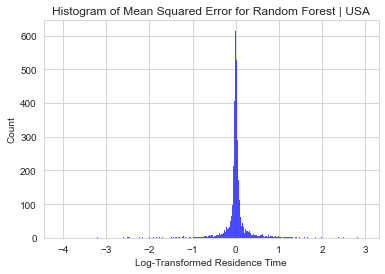

In [124]:
sns.histplot(y_pred-y_test, color='blue')
plt.title('Histogram of Mean Squared Error for Random Forest | USA')
plt.xlabel("Log-Transformed Residence Time")
print('Mean Error:', np.mean((y_pred-y_test)))
print('Std. Dev. Error:', np.std((y_pred-y_test)))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
plt.show()

## Truth Plot

These kind of plots can give us an idea of where our model is over or underestimating. Here we can see small amounts of heteroscedasticity, but the variance is largely contained across the range of data.

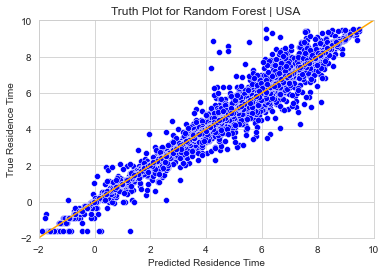

In [180]:
sns.scatterplot(x=y_pred, y=y_test, color='blue')
plt.plot([-2,10], [-2,10], c='orange')
plt.title('Truth Plot for Random Forest | USA')
plt.ylabel('True Residence Time')
plt.xlabel('Predicted Residence Time')
plt.ylim(-2,10)
plt.xlim(-2,10)
plt.show()

## Validation Curve

**Validation curves** are a helpful tool to investigate over or underfitting in your model:
> To validate a model we need a scoring function (see Metrics and scoring: quantifying the quality of predictions), for example accuracy for classifiers. The proper way of choosing multiple hyperparameters of an estimator are of course grid search or similar methods (see Tuning the hyper-parameters of an estimator) that select the hyperparameter with the maximum score on a validation set or multiple validation sets. Note that if we optimized the hyperparameters based on a validation score the validation score is biased and not a good estimate of the generalization any longer. To get a proper estimate of the generalization we have to compute the score on another test set.
However, it is sometimes helpful to plot the influence of a single hyperparameter on the training score and the validation score to find out whether the estimator is overfitting or underfitting for some hyperparameter values. _sci-kit learn documentation 0.23.2._

Here I used a range of number of trees to investigate whether we are overfitting our data. 

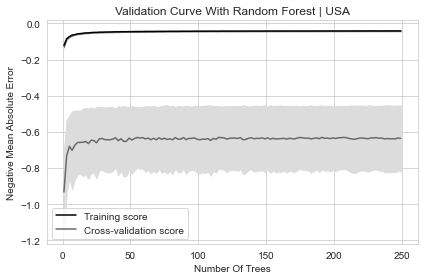

In [189]:
from sklearn.model_selection import validation_curve
# Create range of values for parameter
param_range = np.arange(1, 250, 2)

# Calculate accuracy on training and test set using range of parameter values
train_scores, test_scores = validation_curve(best_grid, 
                                             dd.filter(good_features), 
                                             dd.Res_time, 
                                             param_name="n_estimators", 
                                             param_range=param_range,
                                             cv=3, 
                                             scoring="neg_mean_absolute_error", 
                                             n_jobs=-1)


# Calculate mean and standard deviation for training set scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

# Calculate mean and standard deviation for test set scores
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot mean accuracy scores for training and test sets
plt.plot(param_range, train_mean, label="Training score", color="black")
plt.plot(param_range, test_mean, label="Cross-validation score", color="dimgrey")

# Plot accurancy bands for training and test sets
plt.fill_between(param_range, train_mean - train_std, train_mean + train_std, color="gray")
plt.fill_between(param_range, test_mean - test_std, test_mean + test_std, color="gainsboro")

# Create plot
plt.title("Validation Curve With Random Forest | USA")
plt.xlabel("Number Of Trees")
plt.ylabel("Negative Mean Absolute Error")
plt.tight_layout()
plt.legend(loc="best")
plt.show()

From the results it seems like we may be overfitting. This is because the cross-validation score (resampling of the training dataset to combat overfitting) is lower than our training score, meaning our model is seemingly sensitive to the noise in the training data. That being said, the MAE values are OK, so we can proceed. However, we will keep this in mind and investigate the possibility of an overfit with a validation dataset later.

# Model Validation: China Case Study

The best way to determine the generalizability of our model is to predict **residence times** from a dataset that was never included in the model tuning. In this case I chose the country of China. It has a similar area as the U.S. and a range of latitudes that make it somewhat comparable to the U.S.

So let's do a little bit of data preparation again: This time filtering for lakes within China

In [185]:
df_glcp = pd.read_csv("/Users/jakegearon/PycharmProjects/Geostats/glcp.csv") #Load Data in and restrict to the latitude and longitude of the continguous USA
df_glcp = df_glcp[df_glcp['country'] == "China"]
grp = df_glcp.groupby("Hylak_id")
gr_df = grp.mean()
df_glcp = gr_df.drop(["year"], axis=1)
df_glcp.reset_index(level=0, inplace=True)
sns.scatterplot(data=df_glcp, x='centr_lon', y='centr_lat', s=1.5, color='red')
plt.title('Distribution of Lakes in China')
mg3 = pd.merge(left=df_glcp, right=hyl, on='Hylak_id', how="inner")
drop_list = ['Hylak_id', 'centr_lat', 'centr_lon', 'HYBAS_ID', 'Lake_name', 'Country', 'Continent',
                    'Poly_src', 'Lake_type', 'Grand_id', 'Lake_area', 'Vol_src', 'pop_sum',
                    'geometry', 'Pour_lat', 'Pour_long', 'Dis_avg', 'Vol_total', 'Vol_res']
mg3 = mg3.drop(drop_list, axis=1)

chinadf = mg3[mg3['Res_time'] != -1]
chinadf = chinadf[chinadf['Res_time'] != -9999]
chinadf = chinadf[chinadf['Slope_100'] != -1]
chinadf = chinadf[chinadf['Slope_100'] != -9999]
chinadf = chinadf[(np.abs(stats.zscore(chinadf)) < 3).all(axis=1)]
chinadflog = chinadf.apply(lambda x: np.log(x) if x.name in chinadf.drop(['Elevation'], axis=1).columns else 0 if x.item == 0 else x)
cdd = chinadflog.replace(-np.inf, 0).dropna()

Here is what our data looks like in X, Y space..

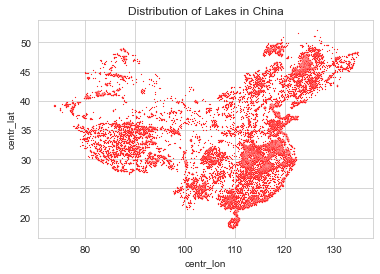

In [187]:
sns.scatterplot(data=df_glcp, x='centr_lon', y='centr_lat', s=1.5, color='red')
plt.title('Distribution of Lakes in China')
plt.show()

Let's investigate the pairplot to make sure our feature distributions are similar to those in the USA

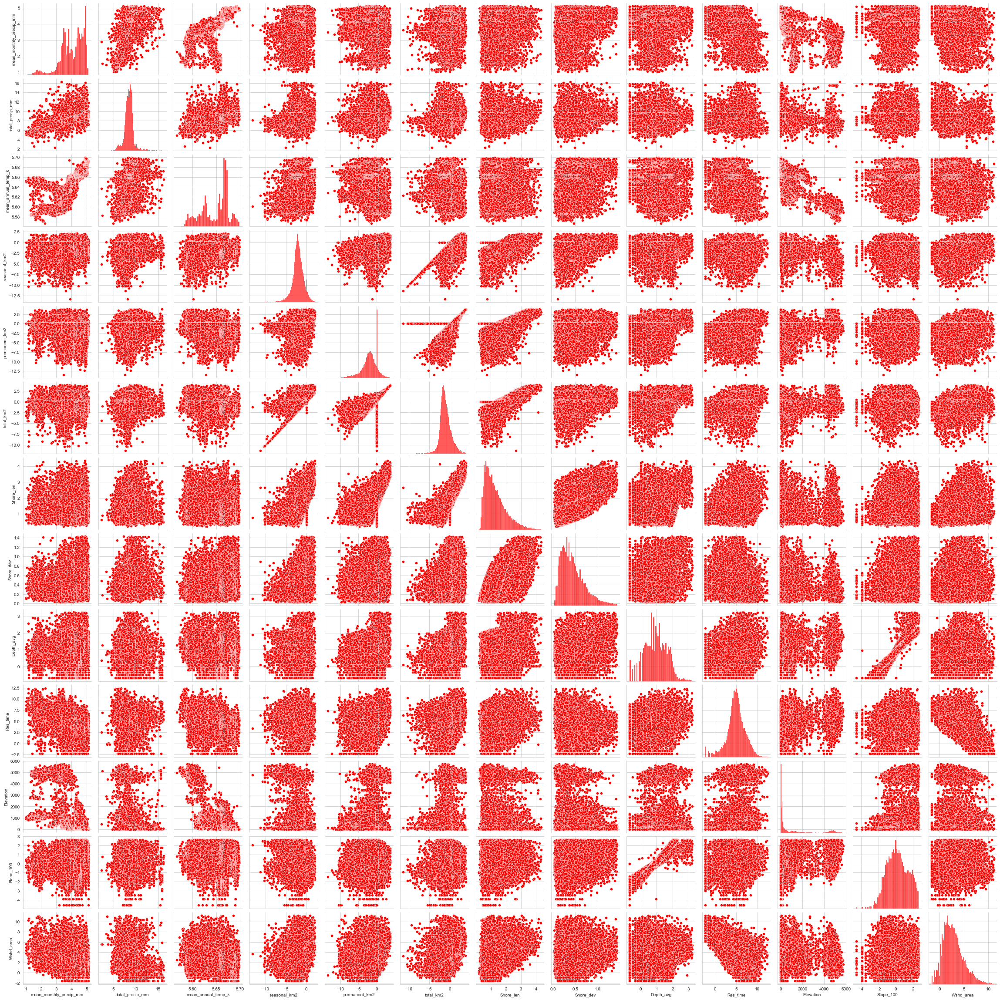

In [190]:
sns.pairplot(cdd, plot_kws={"color":"red"}, diag_kws= {'color': 'red'})
plt.show()

## Model Validation Metrics

Let's predict residence time from the China dataset and see how our model performs

In [170]:
X = cdd.filter(good_features)
y = cdd.Res_time

y_cn_pred = best_grid.predict(X)
regression_results(y, y_cn_pred)

explained_variance:  0.7948
r2:  0.7943
MAE:  0.6438
MSE:  0.9219
RMSE:  0.9601


The model did well in predicting **residence times** of lake basins in China, but our metrics are all definitely somewhat worse. This is to be expected, but we may want to explore options to reduce the variance in the model going forward.

That being said, ~80% accuracy for a dataset that is on the other side of the world from our training data is good! We can be somehwat confident in our model's generalizability.

## Truth Plot for Model Validation

Our truth plot is acceptable but is clearly overestimating compared to the USA truth plot, especially at higher **residence times**... some thought should be put into why we are overestimating at higher values before publication!

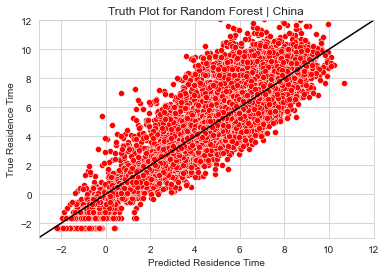

In [173]:
y_cn_pred
sns.scatterplot(y_cn_pred, y, color='red')
plt.plot([-3,12], [-3,12], c='black')
plt.ylim(-3,12)
plt.xlim(-3,12)
plt.ylabel("True Residence Time")
plt.xlabel("Predicted Residence Time")
plt.title('Truth Plot for Random Forest | China')
plt.show()

## Histogram of Error

Our metrics of error are okay, our standard deviation is about 1.0, which is acceptable if not ideal. Mean error is still low, RMSE is also higher. Again, investigating the model variance/bias trade off may assist in future predictions on external datasets.

Mean Error: 0.0476976724626192
Std. Dev. Error: 0.9589509925278011
Root Mean Squared Error: 0.9601364871873209


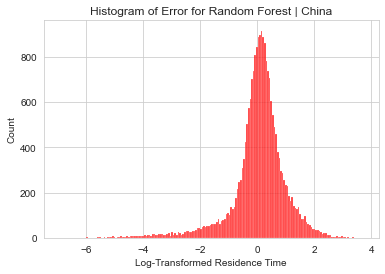

In [184]:
sns.histplot(y_cn_pred-y, color='red')
plt.title('Histogram of Error for Random Forest | China')
plt.xlabel("Log-Transformed Residence Time")
print('Mean Error:', np.mean((y_cn_pred-y)))
print('Std. Dev. Error:', np.std((y_cn_pred-y)))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y, y_cn_pred)))

## Validation Curve

The validation curve for China looks similar to our curve from the USA data—if a bit higher in error during cross-validation.  Further investigation into more parameters may yield insight into model performance

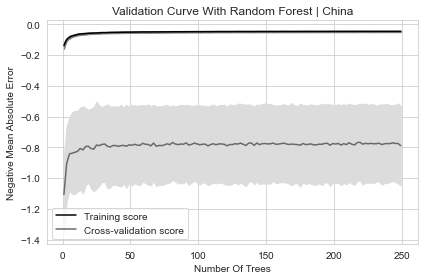

In [191]:
from sklearn.model_selection import validation_curve
# Create range of values for parameter
param_range = np.arange(1, 250, 2)

# Calculate accuracy on training and test set using range of parameter values
train_scores, test_scores = validation_curve(best_grid, 
                                             X, 
                                             y, 
                                             param_name="n_estimators", 
                                             param_range=param_range,
                                             cv=3, 
                                             scoring="neg_mean_absolute_error", 
                                             n_jobs=-1)


# Calculate mean and standard deviation for training set scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

# Calculate mean and standard deviation for test set scores
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot mean accuracy scores for training and test sets
plt.plot(param_range, train_mean, label="Training score", color="black")
plt.plot(param_range, test_mean, label="Cross-validation score", color="dimgrey")

# Plot accurancy bands for training and test sets
plt.fill_between(param_range, train_mean - train_std, train_mean + train_std, color="gray")
plt.fill_between(param_range, test_mean - test_std, test_mean + test_std, color="gainsboro")

# Create plot
plt.title("Validation Curve With Random Forest | China")
plt.xlabel("Number Of Trees")
plt.ylabel("Negative Mean Absolute Error")
plt.tight_layout()
plt.legend(loc="best")
plt.show()

## Summary of Results

I demonstrate here that **residence times** of lake basins in the USA and China can be predicted using 5 salient features: monthly precipitation, water surface area, depth, elevation, and watershed area. Notably, watershed area and monthly precipitation had high Gini importance measures. 

The model for the USA data had almost-too-good results. This may indicate some overfitting. 

| Metric | Value |
| --- | --- |
| explained_variance |  0.9784 |
| MAE | 0.1403 |
| MSE | 0.0988 |
| RMSE | 0.3143 |

The model performed well on the China dataset, with understandably reduced accuracy.

| Metric | Value |
| --- | --- |
| explained_variance |  0.7943 |
| MAE | 0.6438 |
| MSE | 0.9219 |
| RMSE | 0.9601 |

Overall, more data from different locations would help with model variance, but it appears that residence time depends on similar physical variables across the globe (at least at similar latitudes!)


### Parting Comments 

I am a graduate student at the University of Texas at Austin. I study sedimentology (sand, mud, rocks) and enjoy using novel data analytics combined with remote sensing to tackle problems associated with surface processes, climate change, and sediment erosion and deposition. I can be reached at jake.gearon@gmail.com.
